# 卷积神经网络

卷积神经网络是一种前馈型神经网络, 受生物自然视觉认知机制启发而来的. 现在, CNN 已经成为众多科学领域的研究热点之一, 特别是在模式分类领域, 由于该网络避免了对图像的复杂前期预处理, 可以直接输入原始图像, 因而得到了更为广泛的应用. 可应用于图像分类, 目标识别, 目标检测, 语义分割等等.


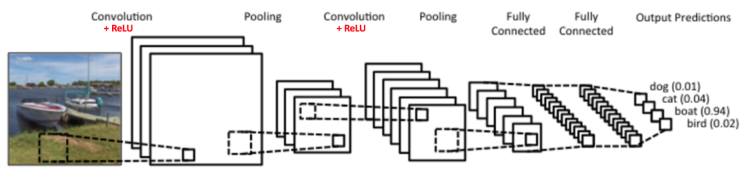
图中是一个图形识别的CNN模型。可以看出最左边的船的图像就是我们的输入层，计算机理解为输入若干个矩阵

　　　　接着是卷积层（Convolution Layer）,这个是CNN特有的，我们后面专门来讲。卷积层的激活函数使用的是ReLU。我们在DNN中介绍过ReLU的激活函数，它其实很简单，就是ReLU(x)=max(0,x)。在卷积层后面是池化层(Pooling layer)，这个也是CNN特有的，需要注意的是，池化层没有激活函数。

　　　　卷积层+池化层的组合可以在隐藏层出现很多次，上图中出现两次。而实际上这个次数是根据模型的需要而来的。当然我们也可以灵活使用使用卷积层+卷积层，或者卷积层+卷积层+池化层的组合，这些在构建模型的时候没有限制。但是最常见的CNN都是若干卷积层+池化层的组合，如上图中的CNN结构。

　　　　在若干卷积层+池化层后面是全连接层（Fully Connected Layer, 简称FC），全连接层类似DNN结构，只是输出层使用了Softmax激活函数来做图像识别的分类，

　　　　从上面CNN的模型描述可以看出，比较特殊的是卷积层和池化层，只要把卷积层和池化层的原理搞清楚了，那么搞清楚CNN就容易很多了。

**CNN基本组成结构**
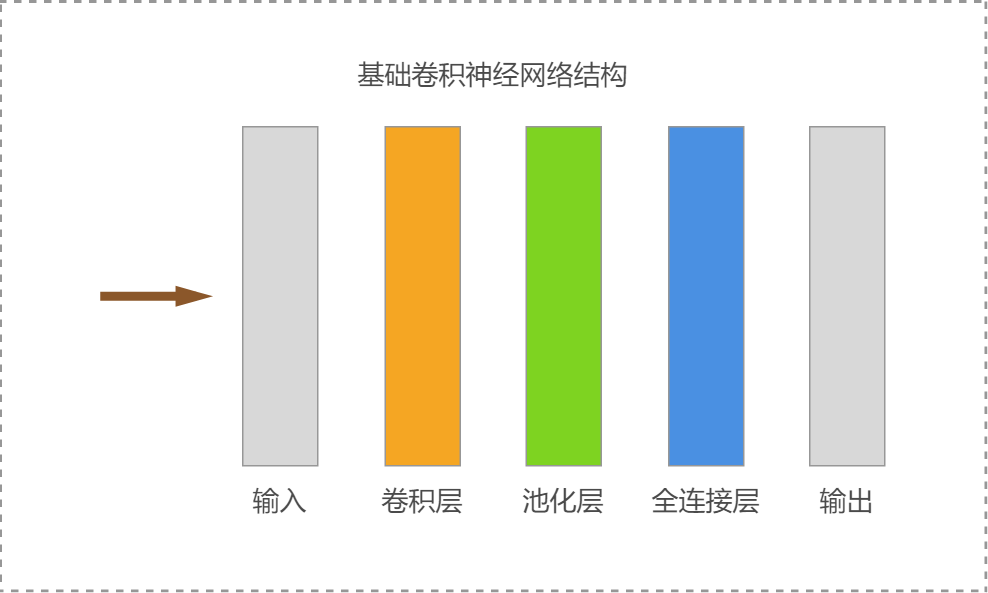

1.输入层：数据的输入，但不是一维的向量，而是保留图片结构

2.卷积层：使用固定的尺寸和权值的卷积核（也称滤波器），以一定的步长移动，对输入的矩阵进行滤波，加偏执，最后激活，最终组成一个特征图

3.池化层：类比卷积核，以固定尺寸，一定步长移动，用最大池化或者平均池化对卷积层得到的特征进行差采样，加偏置，激活，组成一个更小的特征图

4.全链接层：在CNN尾部进行拟合，减少特征值丢失

5.输出层：输出结果

## 卷积层 Convolution Layter

以一张图片为例，以像素值为元素，其中每个像素点都是0-255的数值，根据三原色RGB三通道，将一张图片分为 m * n * k的三维矩阵，其中m 是高度，n 是宽度，k 是深度，这样图片就可以被计算机识别了。如下图。
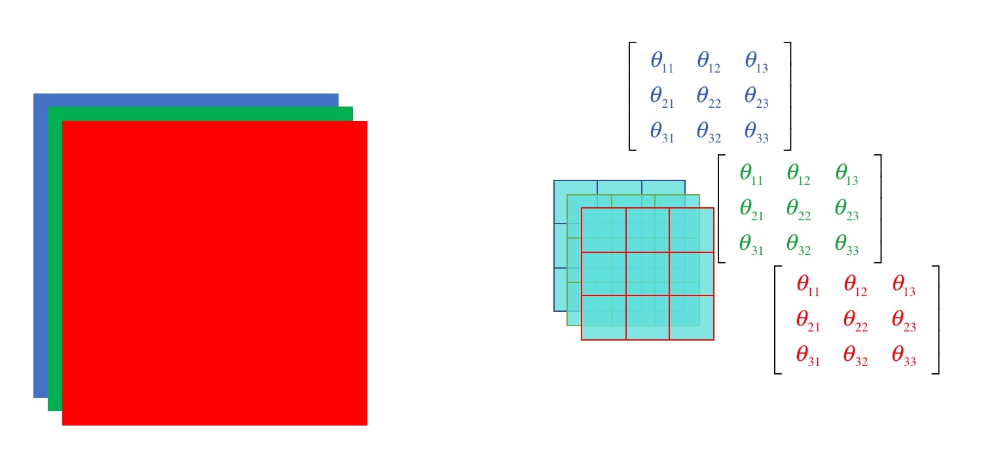
拿其中一维为例，比如有一个5 * 5的矩阵，使用一个3 * 3的卷积核进行卷积，最后会得到一个3 * 3的特征图，卷积核也叫滤波器
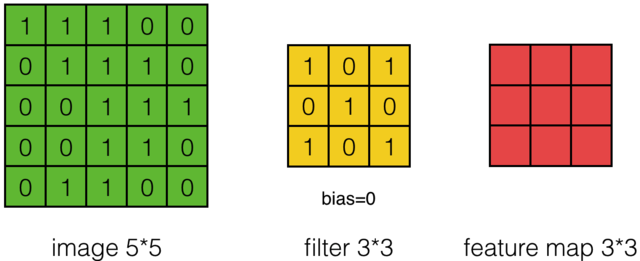

**特征图大小计算**

设输入的矩阵大小为w * w，卷积核大小为k * k，步幅为s，补零层数为p，则特征图大小为

        特征图大小 =（w+2*p-k）/s+1
        （5+2*0-3)/1+1 = 3

具体操作如图所示
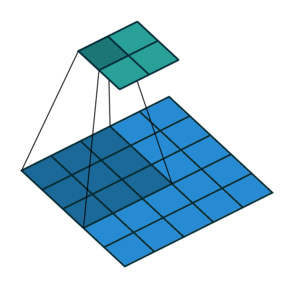
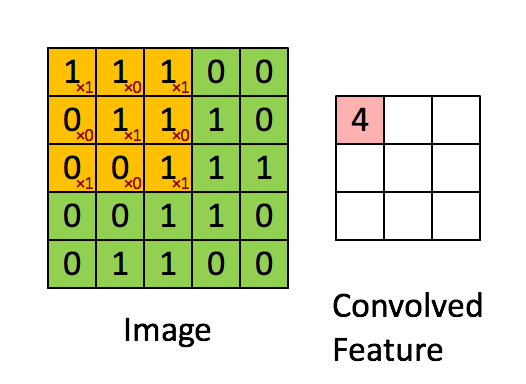

举个例子如下，图中的输入是一个二维的3x4的矩阵，而卷积核是一个2x2的矩阵。这里我们假设卷积是一次移动一个像素来卷积的，那么首先我们对输入的左上角2x2局部和卷积核卷积，即各个位置的元素相乘再相加，得到的输出矩阵S的S00的元素，值为aw+bx+ey+fz。接着我们将输入的局部向右平移一个像素，现在是(b,c,f,g)四个元素构成的矩阵和卷积核来卷积，这样我们得到了输出矩阵S的S01的元素，同样的方法，我们可以得到输出矩阵S的S02，S10，S11，S12的元素。

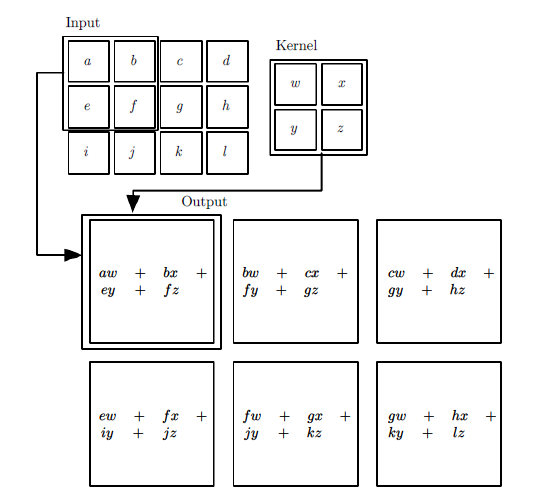

## 步长Stride

从具体操作中，我们可以发现卷积核每次移动的距离是不同的，这里把卷积核移动的距离称之为步长。

我们不难发现，不同的步长卷积的效率不同，这样我们可以，我们可以通过对步长的控制，来提高对大的图片卷积的效率。

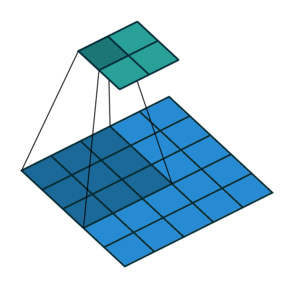
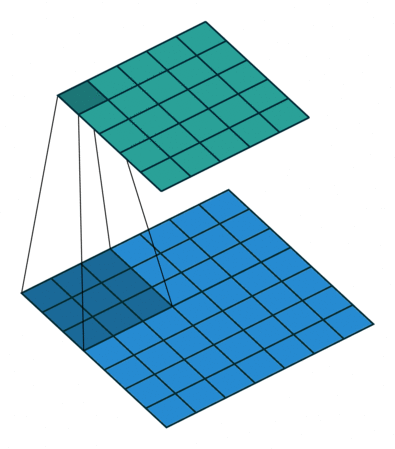

## 补零（边缘扩展） Padding

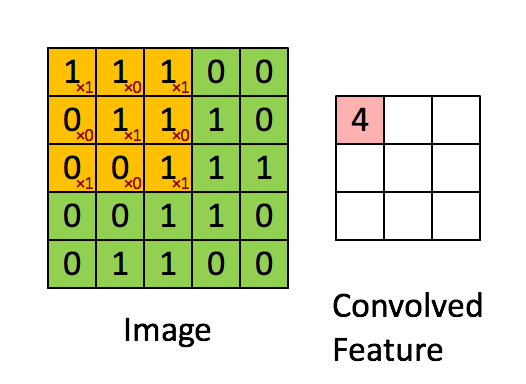

黄色的区域表示卷积核在输入矩阵中滑动, 每滑动到一个位置, 将对应数字相乘并求和, 得到一个特征图矩阵的元素. 注意到, 动图中卷积核每次滑动了一个单位, 实际上滑动的幅度可以根据需要进行调整. 如果滑动步幅大于 1, 则卷积核有可能无法恰好滑到边缘, 针对这种情况, 可在矩阵最外层补零, 补一层零后的矩阵如下图所示: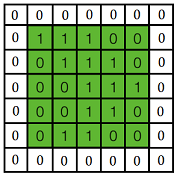
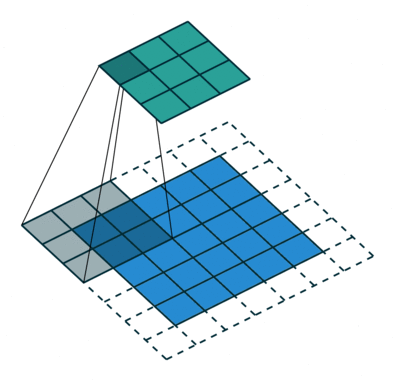

补零层是一个超参数，补零层的设置要根据卷积核的大小、步幅，输入矩阵的大小进行调整，以使卷积层滑到边缘

    注：  超参数是在开始学习过程之前设置值的参数，而不是通过训练得到的参数数据。通常情况下，需要对超参数进行优化，给学习机选择一组最优超参数，以提高学习的性能和效果。

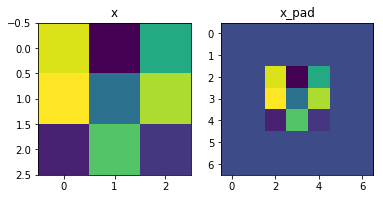

In [3]:
#  padding  补零填充代码

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
 
def zero_pad(X, pad):
    X_pad = np.pad(X, ((0,0), (pad, pad), (pad, pad), (0, 0)), 'constant')    
    return X_pad
np.random.seed(1)
x = np.random.randn(4, 3, 3, 2)
x_pad = zero_pad(x, 2)
fig, axarr = plt.subplots(1, 2)
axarr[0].set_title('x')
axarr[0].imshow(x[0,:,:,0])
axarr[1].set_title('x_pad')
axarr[1].imshow(x_pad[0,:,:,0])
plt.show()

**高维卷积**

通常把一张图片分解为根据r g b分为三维的矩阵，此时输入的矩阵是3维，卷积层也相应的变为3层

如图
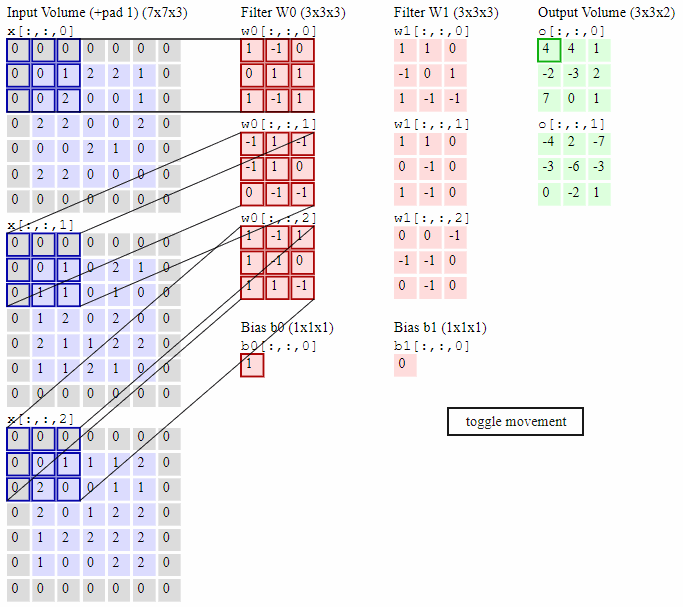

最左边的是输入的特征图矩阵，深度为3，补零层数为1，移动步幅为2

在这里，每次滑动会得到三个数，这三个数之和作为卷积层的输出，等到最右边两个特征图

## 池化层

卷层得到的特征图需要通过池化降低数据数量

池化方法一般为  最大值池化和平局值池化

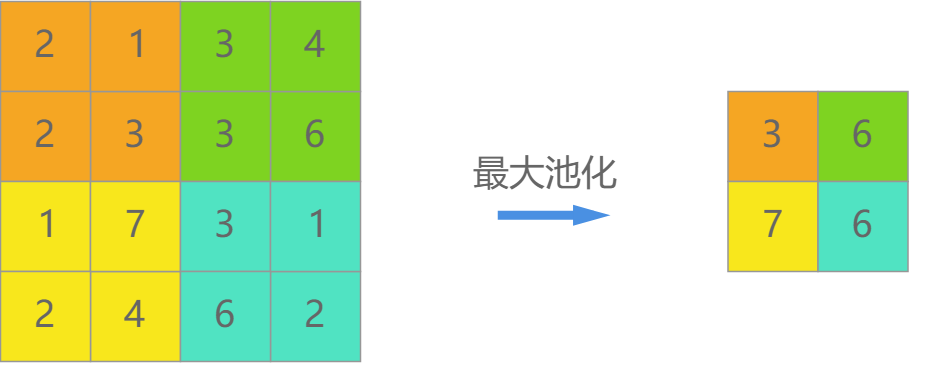
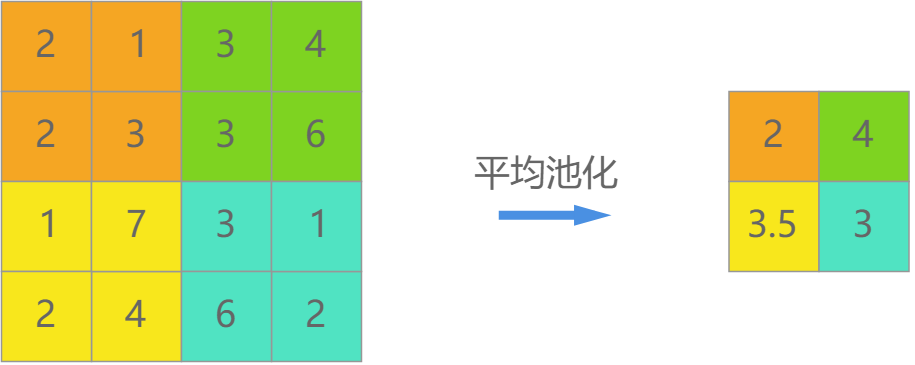
和卷积一样, 池化也有一个滑动的核, 可以称之为滑动窗口, 上图中滑动窗口的大小为 2×2, 步幅为 2, 每滑动到一个区域, 则取最大值作为输出, 这样的操作称为 Max Pooling. 还可以采用输出均值的方式, 称为 Mean Pooling.

## 卷积神经网络前向传导

### 隐藏层-->卷积层
　　　　我们这里还是以图像识别为例。

　　　　先考虑最简单的，样本都是二维的黑白图片。这样输入层X就是一个矩阵，矩阵的值等于图片的各个像素位置的值。这时和卷积层相连的卷积核W就也是矩阵。

　　　　如果样本都是有RGB的彩色图片，这样输入X就是3个矩阵，即分别对应R，G和B的矩阵，或者说是一个张量。这时和卷积层相连的卷积核W就也是张量，对应的最后一维的维度为3.即每个卷积核都是3个子矩阵组成。

　　　　同样的方法，对于3D的彩色图片之类的样本，我们的输入X可以是4维，5维的张量，那么对应的卷积核W也是个高维的张量。

　　　　不管维度多高，对于我们的输入，前向传播的过程可以表示为：
    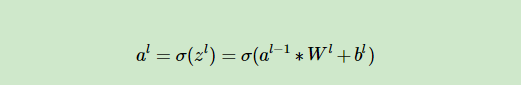
    其中，上标代表层数，星号代表卷积，而b代表我们的偏置项, σ为激活函数，这里一般都是ReLU。
    
为了方便计算写成矩阵的形式
   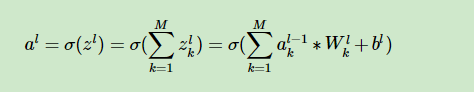
   
   
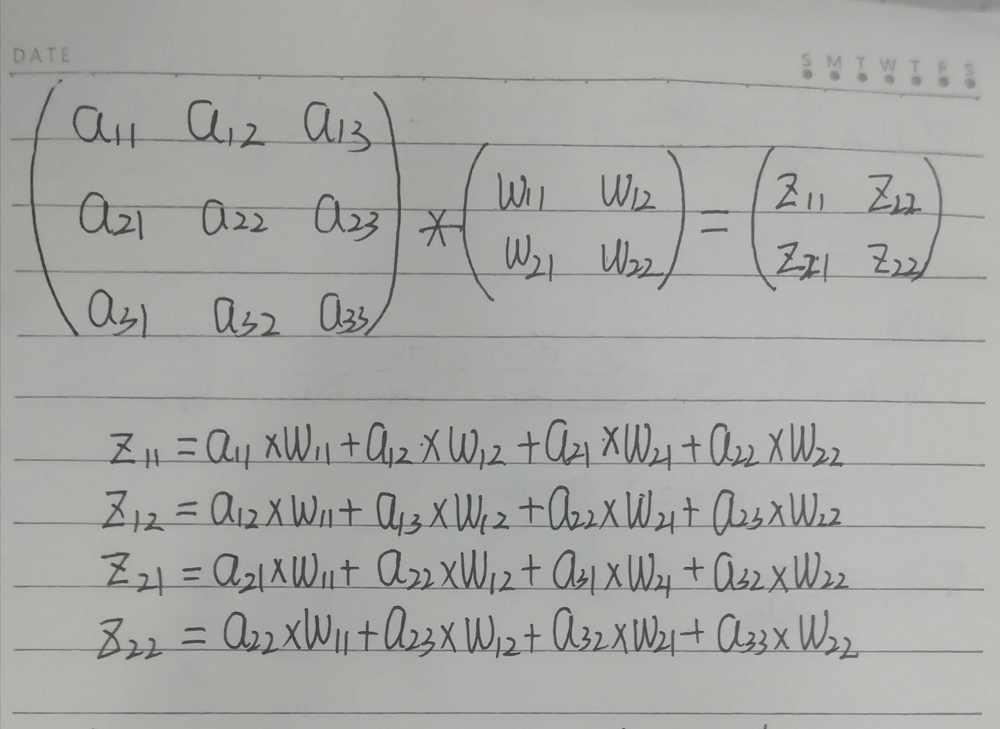
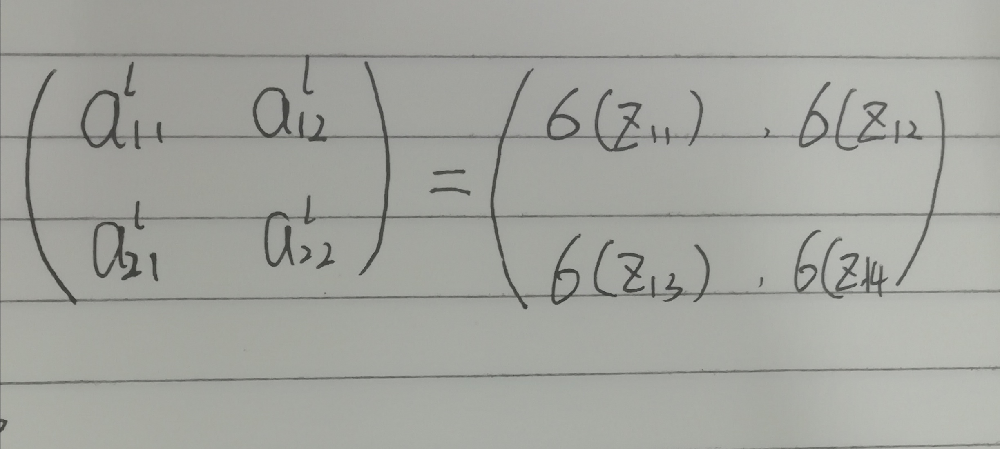
   
 卷积层我们需要定义卷积核的个数K，卷积核子矩阵的维度F，填充大小P以及步幅S。

### 卷积层-->池化层

池化层的处理逻辑是比较简单的，我们的目的就是对输入的矩阵进行缩小概括。比如输入的若干矩阵是NxN维的，而我们的池化大小是kxk的区域，则输出的矩阵都是N/k维的。（注意补零）
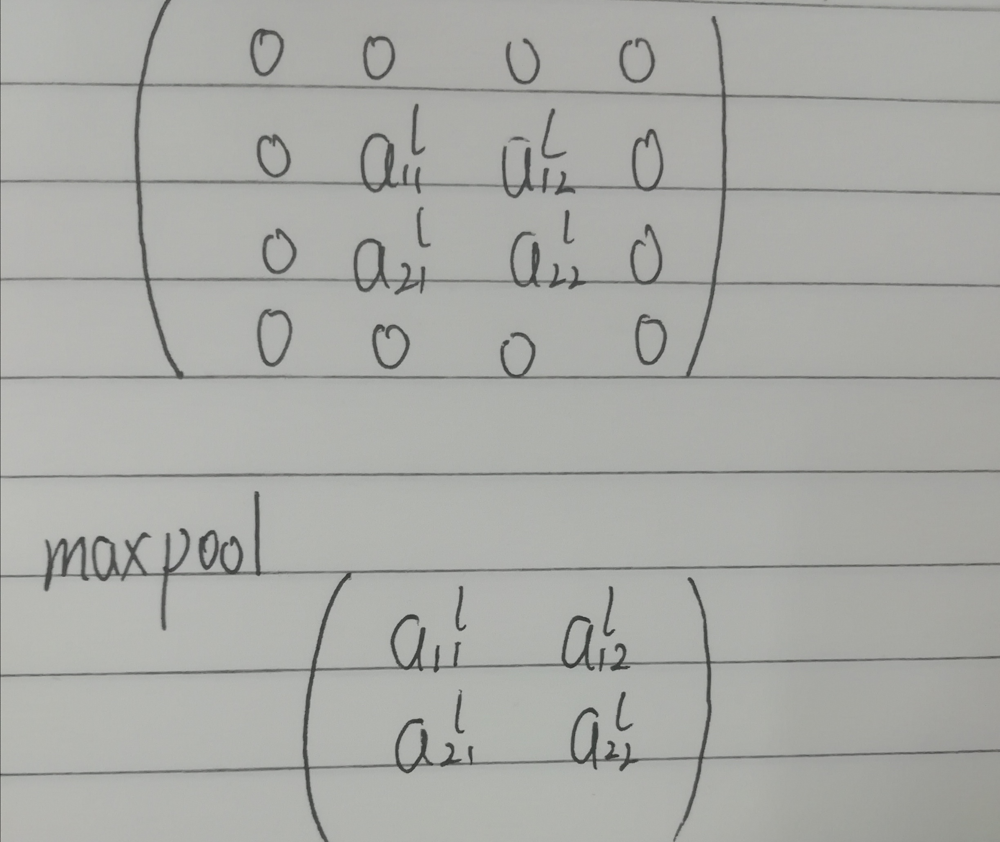

     这里需要需要我们定义的CNN模型参数是：

　　　　1）池化区域的大小k

　　　　2）池化的标准，一般是MAX或者Average。

### 全链接层

经过了若干全连接层之后，最后的一层为Softmax输出层。此时输出层和普通的全连接层唯一的区别是，激活函数是softmax函数。

这里需要需要我们定义的CNN模型参数是：

　　　　1）全连接层的激活函数

　　　　2）全连接层各层神经元的个数

**总结**

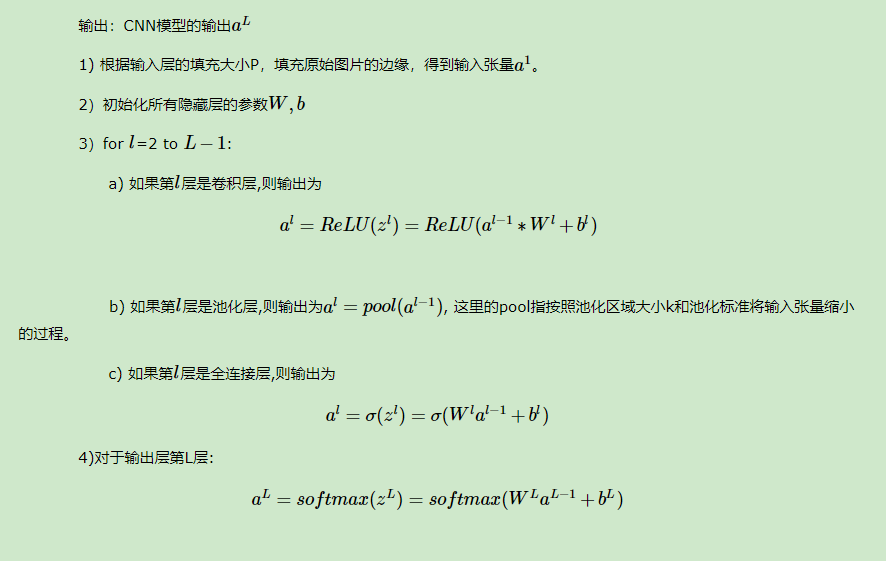

函数用于卷积神经网络最后一层，对数据进行分类，不过该分类对每个可能结果都进行分类（小概率照样分类）

**栗子**

卷积神经网络是权值共享，非全连接的神经网络。以2个卷积层和2个池化层的卷积神经网络为例，其结构图如下：
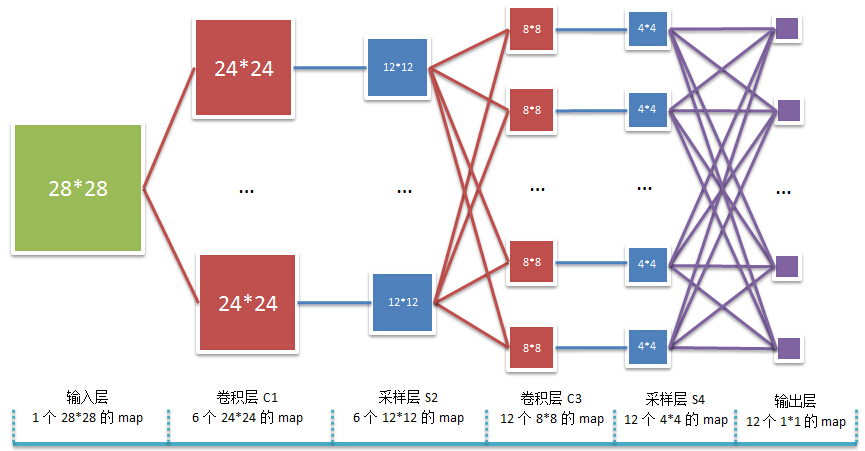

**C1层**：卷积神经网络输入的是28 * 28的矩阵A，经过F1个5 * 5 的卷积核Ki1（i=1,2,3,4...）的卷积生成F1个24 * 24 大小的feature maps：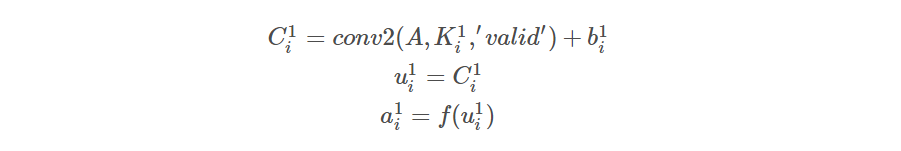

**S2层**：接着池化，池化窗口为2 * 2，一个24 * 24 的 feature map 池化成一个12 * 12 大小的 pool map，共生成F1个pool maps：
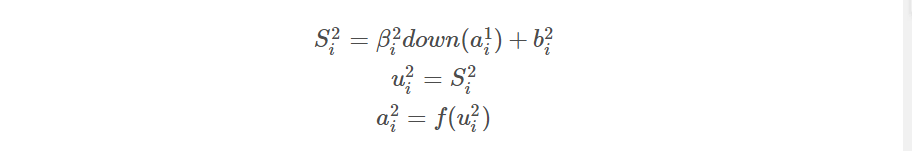

**C3层**：接着再次卷积，C3层中每个8 * 8 的feature map 池化成一个12 * 12 大小的 pool map ，共生成F1个pool maps
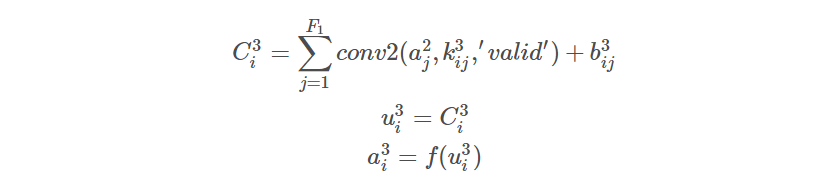

**S4层**：接着再次池化，池化窗口为2×2，一个8×8的feature map池化成一个4×4大小的pool map，共生成F3个pool maps：
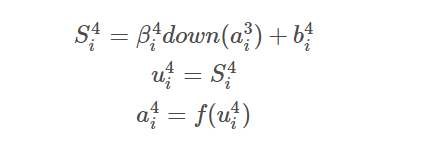
**全连接层**：最后，将a4i(i=1,2,...,F3)顺序展开成向量，并有序连接成一个长向量，作为全连接层网络的输入。

## 卷积神经网络反向传导

### 池化层-->卷积层 

反向传播时，我们首先会把所有子矩阵矩阵大小还原成池化之前的大小，然后如果是MAX，则把所有子矩阵的各个池化局域的值放在之前做前向传播算法得到最大值的位置。如果是Average，则把δl的所有子矩阵的各个池化局域的值取平均后放在还原后的子矩阵位置。这个过程一般叫做upsample

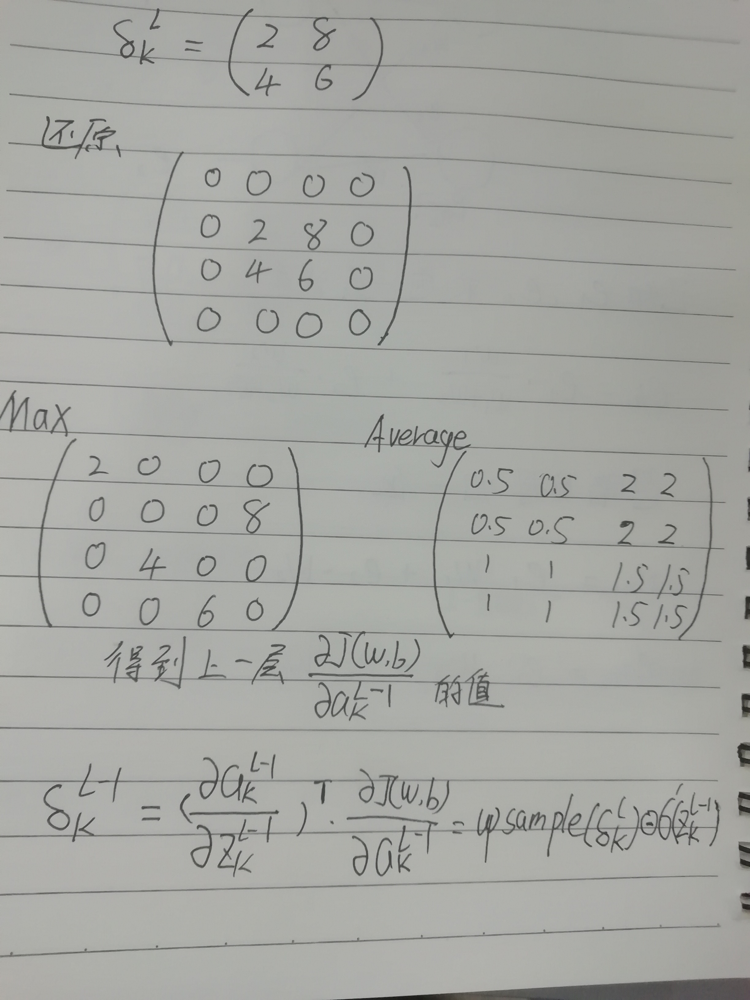

### 卷积层-->隐藏层

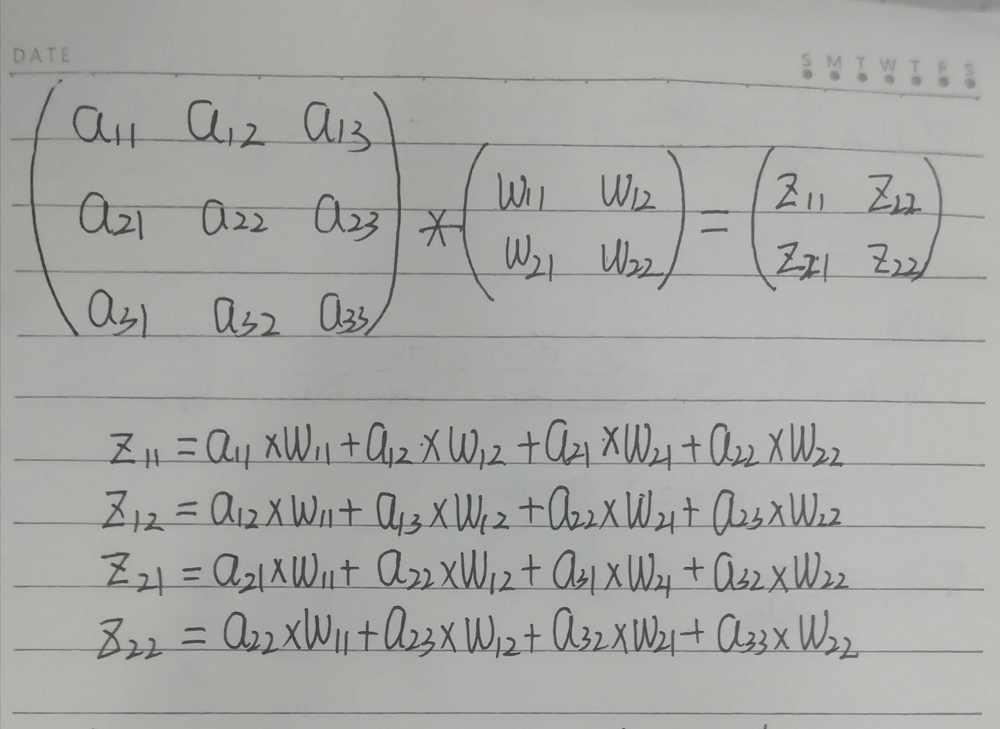

在反向求导之前，先求梯度误差，梯度误差是为了对每一层权值更新是方便，下面介绍，如何从最后一层误差求前一层误差
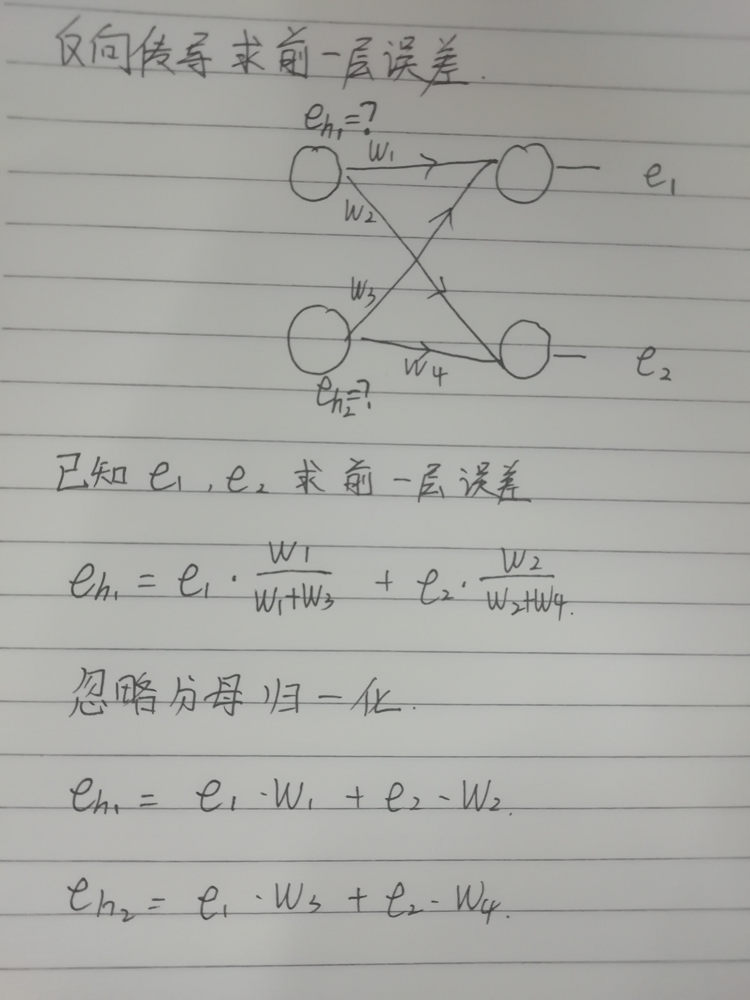

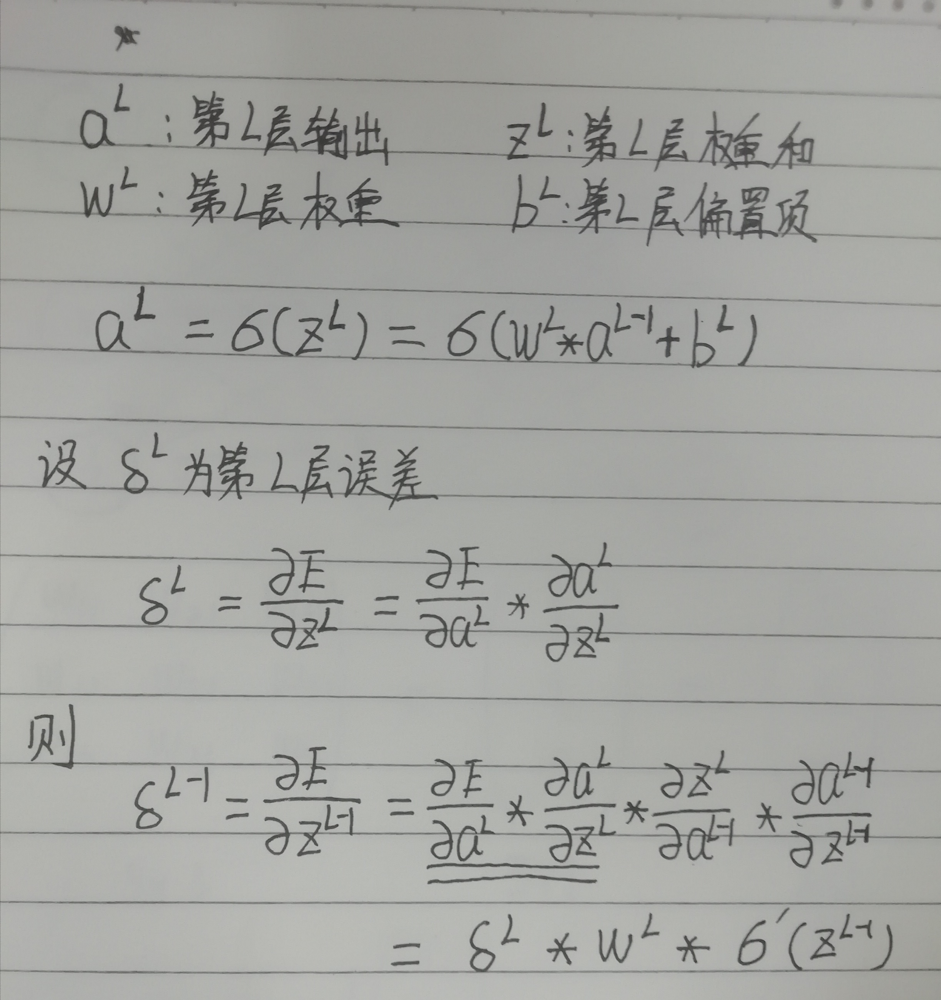
权重矩阵转置
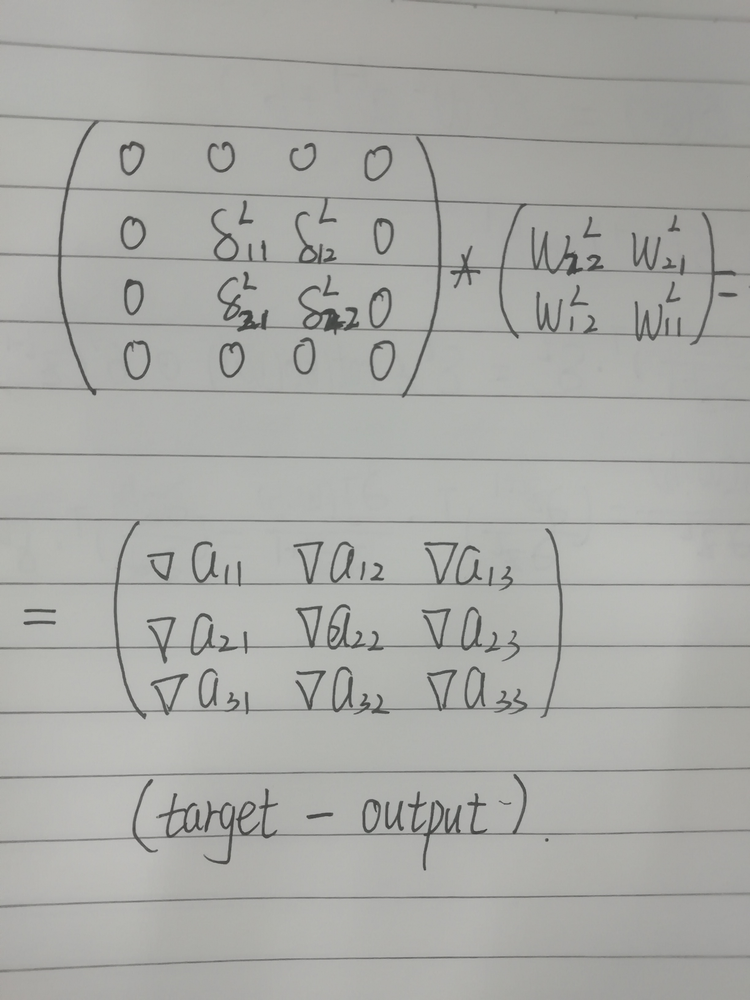
主要目的，认为是为了python代码用，好计算

下面开始更新权值
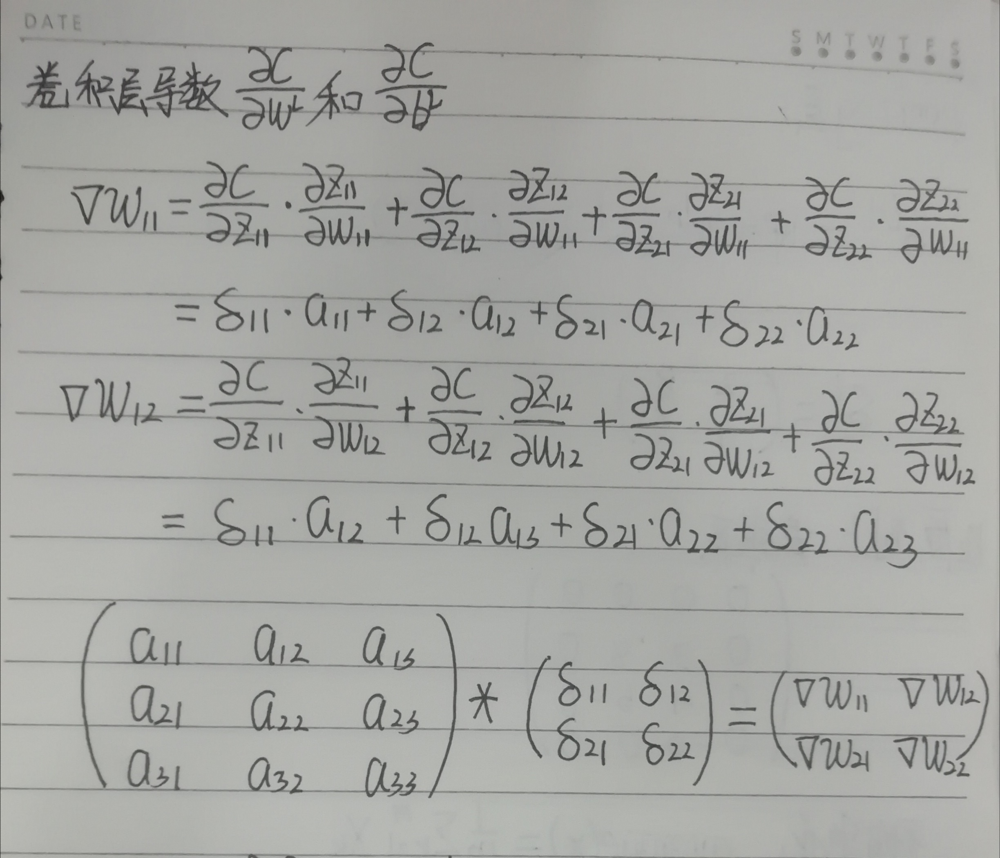

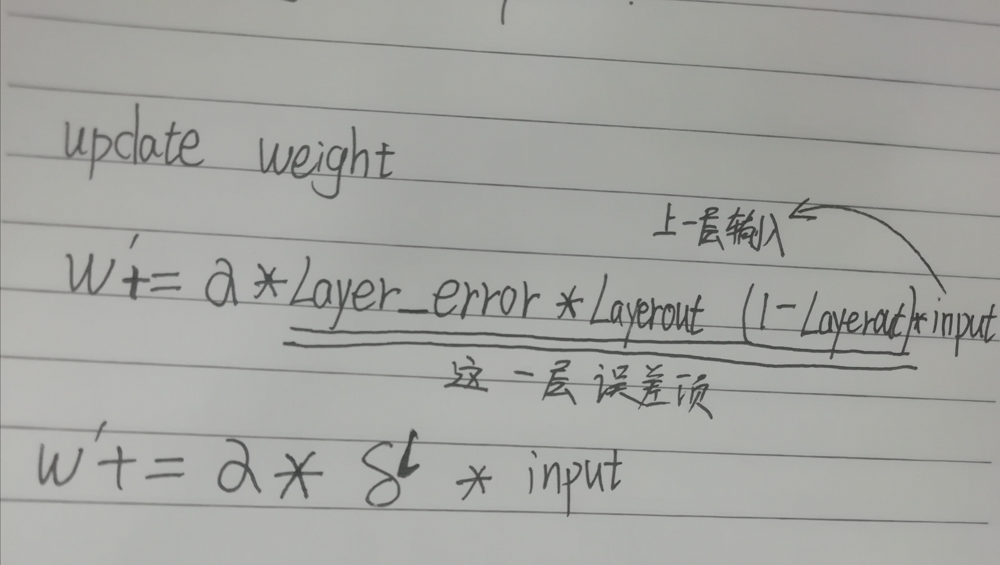

## 经典的神经网络

### LeNet

LeNet诞生于1994年，由深度学习三巨头之一的Yan LeCun提出，他也被称为卷积神经网络之父。LeNet主要用来进行手写字符的识别与分类，准确率达到了98%，并在美国的银行中投入了使用，被用于读取北美约10%的支票。LeNet奠定了现代卷积神经网络的基础。

**网络结构**
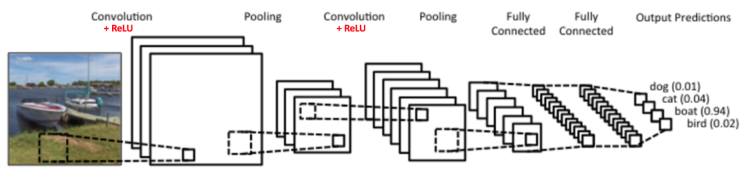
上图为LeNet结构图，是一个6层网络结构：三个卷积层，两个下采样层和一个全连接层（图中C代表卷积层，S代表下采样层，F代表全连接层）。其中，C5层也可以看成是一个全连接层，因为C5层的卷积核大小和输入图像的大小一致，都是5*5

**网络特点**

1. 每个卷积层包括三部分：卷积、池化和非线性激活函数（sigmoid激活函数）
2. 使用卷积提取空间特征
3. 降采样层采用平均池化

### AlexNet

**网络背景**

AlexNet由Hinton的学生Alex Krizhevsky于2012年提出，并在当年取得了Imagenet比赛冠军。AlexNet可以算是LeNet的一种更深更宽的版本，证明了卷积神经网络在复杂模型下的有效性，算是神经网络在低谷期的第一次发声，确立了深度学习，或者说卷积神经网络在计算机视觉中的统治地位。

**网络结构**

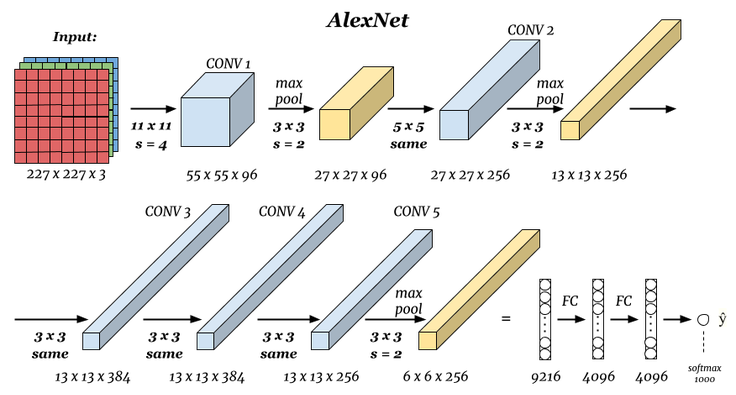
原作者在训练 AlexNet 时，一个 GPU 负责图中顶层部分，一个 GPU 运行图中底层部分，GPU 之间仅在某些层互相通信。5 个卷积层，5 个池化层，3 个全连接层，大约 5000 万个可调参数组成了这个经典的卷积神经网络。最后的全连接层输出到 1000 维的 softmax 层，产生一个覆盖 1000 类标记的分布。最终完成了对 ImageNet 的分类任务。

**网络特点**

１．　使用两块GPU并行加速训练，大大降低了训练时间

２．　成功使用ReLu作为激活函数，解决了网络较深时的梯度弥散问题

３．　使用数据增强、dropout和LRN层来防止网络过拟合，增强模型的泛化能力

### VGGNet

**网络背景**

VGGNet是牛津大学计算机视觉组和Google DeepMind公司一起研发的深度卷积神经网络，并取得了2014年Imagenet比赛定位项目第一名和分类项目第二名。该网络主要是泛化性能很好，容易迁移到其他的图像识别项目上，可以下载VGGNet训练好的参数进行很好的初始化权重操作，很多卷积神经网络都是以该网络为基础，比如FCN，UNet，SegNet等。vgg版本很多，常用的是VGG16，VGG19网络。

**网络结构**

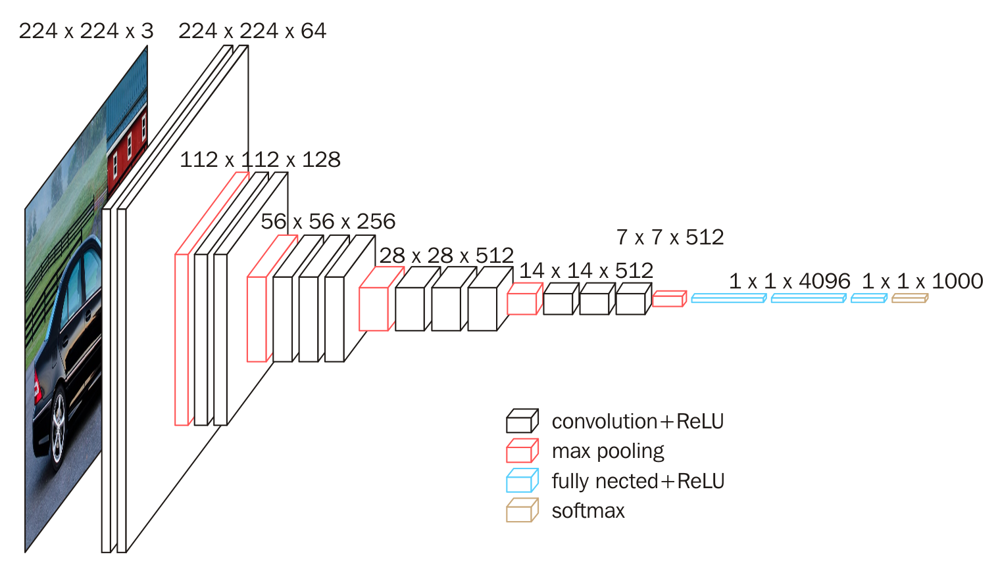
上图为VGG16的网络结构，共16层（不包括池化和softmax层），所有的卷积核都使用3*3的大小，池化都使用大小为2*2，步长为2的最大池化，卷积层深度依次为64 -> 128 -> 256 -> 512 ->512。

**网络特点**

网络结构和AlexNet有点儿像，不同的地方在于：

    主要的区别，一个字：深，两个字：更深。把网络层数加到了16-19层（不包括池化和softmax层），而AlexNet是8层结构。
    将卷积层提升到卷积块的概念。卷积块有2~3个卷积层构成，使网络有更大感受野的同时能降低网络参数，同时多次使用ReLu激活函数有更多的线性变换，学习能力更强
    在训练时和预测时使用Multi-Scale做数据增强。训练时将同一张图片缩放到不同的尺寸，在随机剪裁到224*224的大小，能够增加数据量。预测时将同一张图片缩放到不同尺寸做预测，最后取平均值。


### ResNet

**网络背景**

ResNet（残差神经网络）由微软研究院的何凯明等4名华人于2015年提出，成功训练了152层超级深的卷积神经网络，效果非常突出，而且容易结合到其他网络结构中。在五个主要任务轨迹中都获得了第一名的成绩：

    ImageNet分类任务：错误率3.57%
    ImageNet检测任务：超过第二名16%
    ImageNet定位任务：超过第二名27%
    COCO检测任务：超过第二名11%
    COCO分割任务：超过第二名12%


**网络结构**
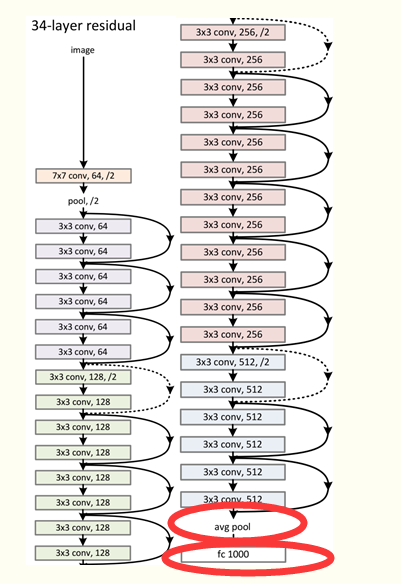
**网络特点**

    使得训练超级深的神经网络成为可能，避免了不断加深神经网络，准确率达到饱和的现象（后来将层数增加到1000层）
    输入可以直接连接到输出，使得整个网络只需要学习残差，简化学习目标和难度。
    ResNet是一个推广性非常好的网络结构，容易和其他网络结合

### 历史发展

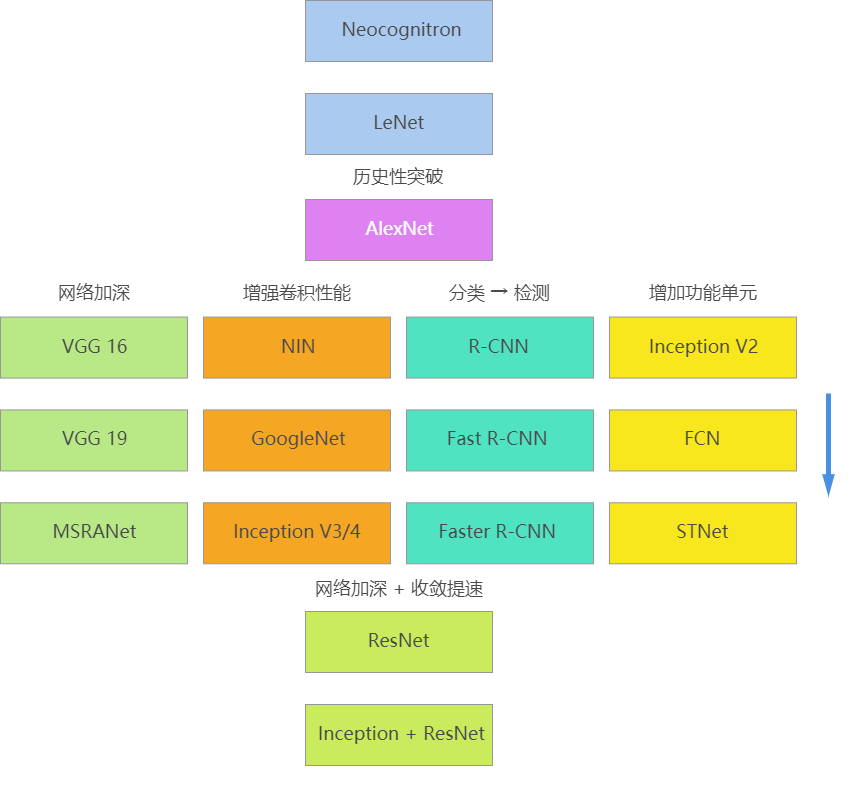